# BME 133 Lab 11

Welcome!

To begin, create a copy of this file using File -> Save as... and name the new file "Lab_11_LastName_FirstName.ipynb" using your last and first name.  Make sure to execute all the code cells in the notebook and that the outputs show in your report. *Two points are allocated for reading and running the code blocks*. Before submitting, remember to add a collaboration statement in this mark down indicating the contribution of each member. You may edit the template below:

- Group member 1 first name, last name & student id: contributions here
- Group member 2 first name, last name & student id: contributions here
- if applicable, Group member 3 first name, last name & student id: contributions here

This Lab will cover image processing, including noise removal, image segmentation (object identification), and quantification.

Materials for this lab are adapted from a series of Jupyter Notebooks by Guillaume Witz, © Copyright 2021. Who expressly permits use of this material for learning and teaching. The original notebooks can be found on [Github](https://guiwitz.github.io/PyImageCourse_beginner/README.html).

The images come from the [Cell Atlas](https://www.proteinatlas.org/humanproteome/cell). For more information see the publication of Thul PJ et al., A subcellular map of the human proteome. Science. (2017) DOI: [10.1126/science.aal3321](https://doi.org/10.1126/science.aal3321). All images are covered by a [Creative Commons Attribution-ShareAlike 3.0 International License](https://creativecommons.org/licenses/by-sa/3.0/).


## Image Processing Kernels

Filtering images is at the core of image processing. Image blurring, sharpening, unsharpening, edge or object detection, all rely on the use of a kernel or convolution matrix. Not to be confused with a computer kernel program (a program that communicates with the CPU and hardware). A kernel in *image processing* is a matrix (usually 3x3 or 5x5) that takes input from each pixel and its surrounding neighbors, assigns a weight to each, and uses the weighted values to calculate a new pixel value for the output image. 

![2D_convolution_Animation.gif](https://upload.wikimedia.org/wikipedia/commons/1/19/2D_Convolution_Animation.gif)

Image by Michael Plotke [CC BY-SA 3.0](https://creativecommons.org/licenses/by-sa/3.0)

In the simplest case, we can imagine that a kernel travels across the image and computes the *local mean* of the pixels with which it overlaps. This is then a mean filter:

In [2]:
from IPython.display import HTML, display
HTML(filename='convol_mean.html')
#https://guiwitz.github.io/PyImageCourse_beginner/05-Filtering.html

Multiple properties of the kernel can change:
- the pixel values of the kernel can be anything. For example it's common to have a 2D gaussian for smoothing the image (see below)
- the size and shape of the kernel can change
- the operation done by the kernel does not have to be a simple multiplication-addition (convolution). It can also be another function like a median for example.

Filters can be applied to regular images, as well as to masks (binary images) and are often used to clean-up an image or to detect objects. scikit-image implements most of these filters in ```skimage.filters``` and ```skimage.morphology``` and we are going to look at a few.

In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import skimage
import skimage.io
import skimage.morphology
import scipy.ndimage as ndi

## Linear filters

### Blurring effect

Linear filters work by convoluting an image with a smaller template. That small template can be anything, but commonly it is a well-defined small matrix. For example it can be a 2D Gaussian. We can have a look at its actual shape by filtering an image that has a single pixel ON:

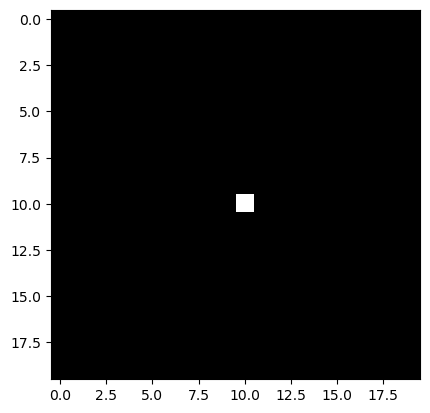

In [4]:
single_dot = np.zeros((20,20))
single_dot[10,10] = 1
plt.imshow(single_dot, cmap = 'gray')

The Gaussian has default values and we can simply apply it on an image:

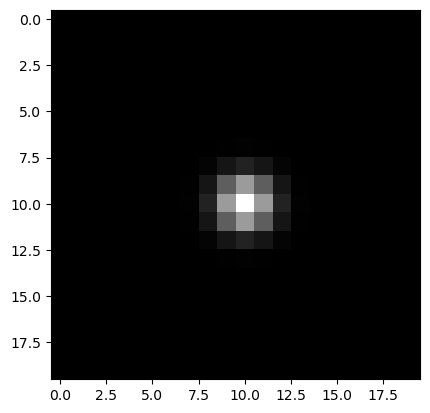

In [5]:
filtered = skimage.filters.gaussian(single_dot)
plt.imshow(filtered, cmap = 'gray')

We can plot a cross section of the image to better understand what happened:

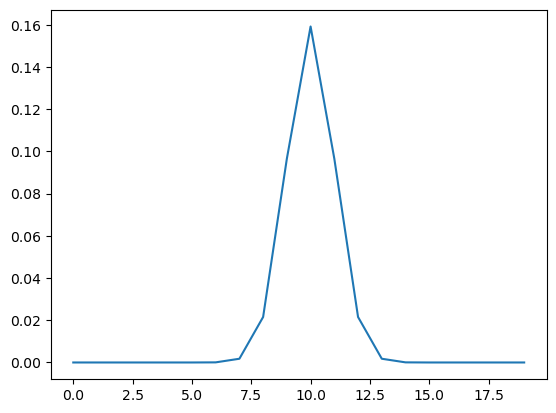

In [6]:
plt.plot(filtered[10,:])

The effect of this filtering was to "widen" the original single pixel, which is now spread out across the image. We can now also specify the width of the gaussian:

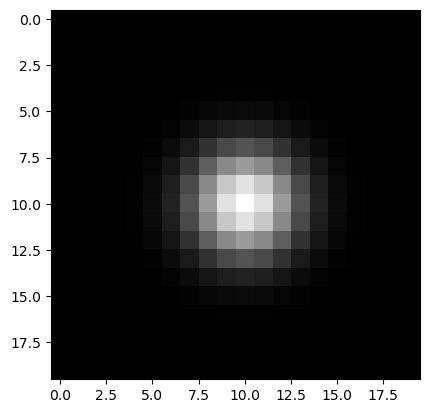

In [7]:
filtered = skimage.filters.gaussian(single_dot,sigma=2)
plt.imshow(filtered, cmap = 'gray')

The Gaussian has become even wider. Let's put two dots on our image and see what happens:

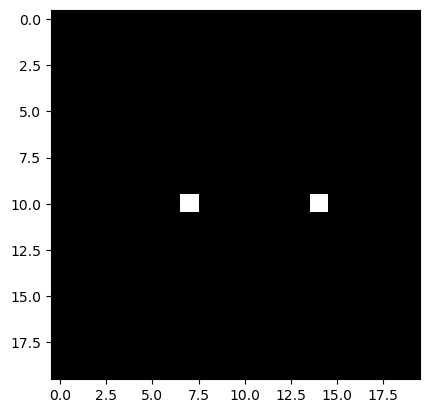

In [8]:
double_dot = np.zeros((20,20))
double_dot[10,7] = 1
double_dot[10,14] = 1
plt.imshow(double_dot, cmap = 'gray')

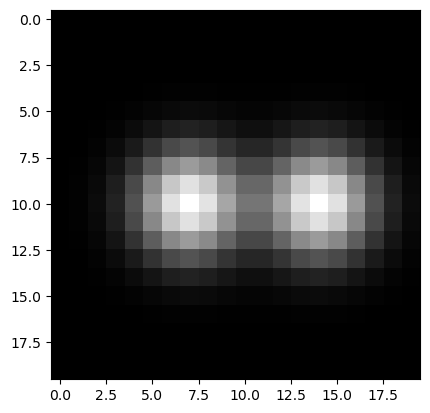

In [9]:
filtered = skimage.filters.gaussian(double_dot,sigma=2)
plt.imshow(filtered, cmap = 'gray')

The end effect is to blur our image. If we apply our filter twice we get an even blurrier image:

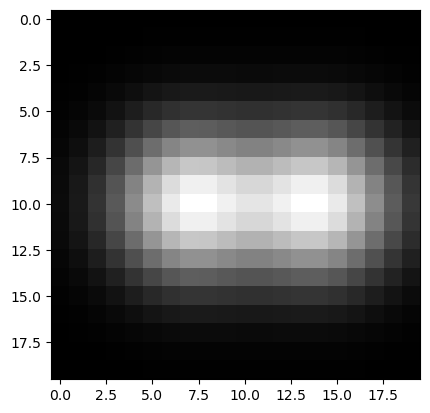

In [10]:
filtered2 = skimage.filters.gaussian(filtered,sigma=2)
plt.imshow(filtered2, cmap = 'gray')

### Removing noise

Gaussian filtering does not only blur information, it also helps removing noise. Let's for example take again our blurred image and add some noise to it. For that we use the numpy random module:

In [11]:
noisy = filtered + 0.02*np.random.rand(20,20)

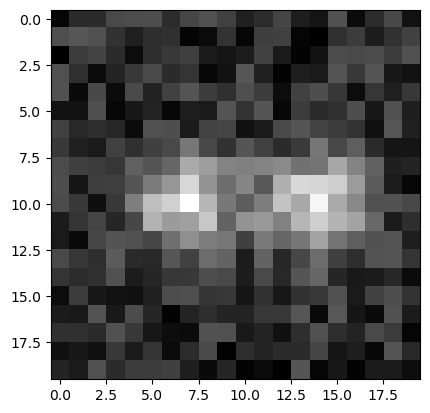

In [12]:
plt.imshow(noisy, cmap = 'gray')

If we now apply again our gaussian filter:

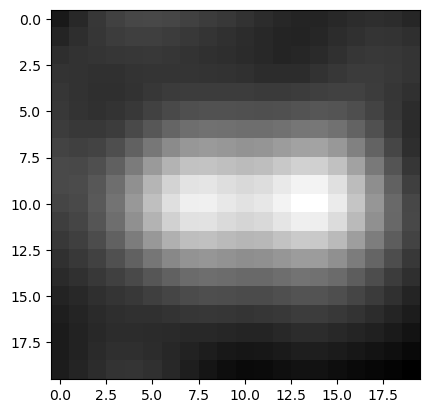

In [13]:
noise_filtered = skimage.filters.gaussian(noisy,sigma=2)
plt.imshow(noise_filtered, cmap = 'gray')

We obtain an image which of course is blurred, but where the strong noise has mostly disappeared.

### Filtering an image

We have been toying here with single pixel images, but of course the goal is to apply such a filter to an actual image. Let's import one and adjust the width of our gaussian to see it's effect on a real image:

In [ ]:
#image_stack = skimage.io.imread('images/46658_784_B12_1.tif')
image_stack = skimage.io.imread('https://github.com/guiwitz/PyImageCourse_beginner/raw/master/images/46658_784_B12_1.tif')
image_nuclei = image_stack[1250:1750,300:800,2]

(2048, 2048, 3)


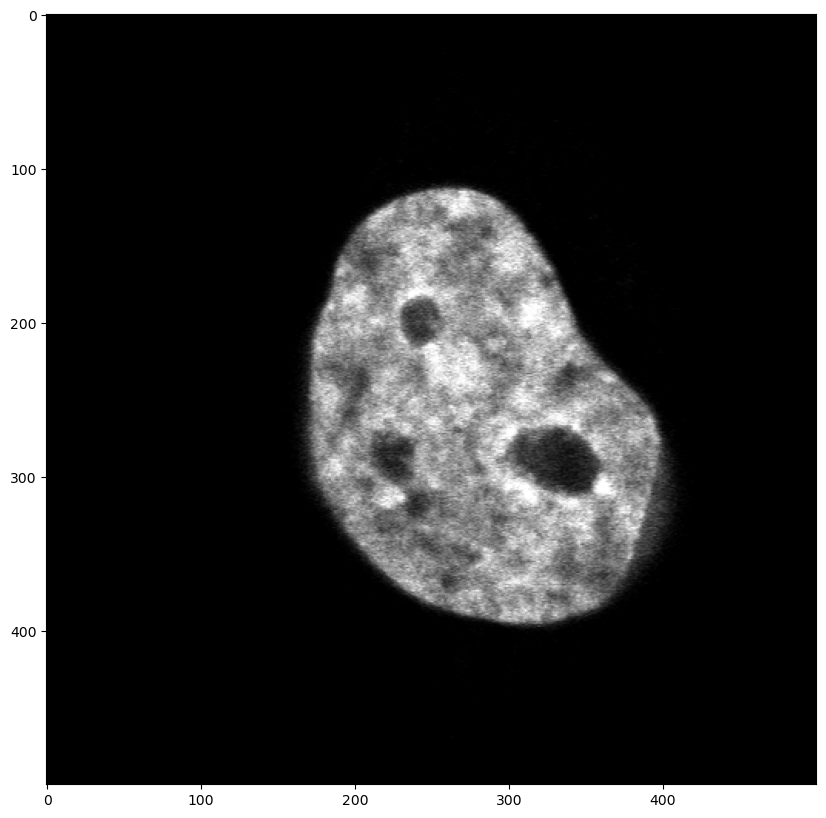

In [15]:
plt.subplots(figsize=(10,10))
plt.imshow(image_nuclei, cmap = 'gray')

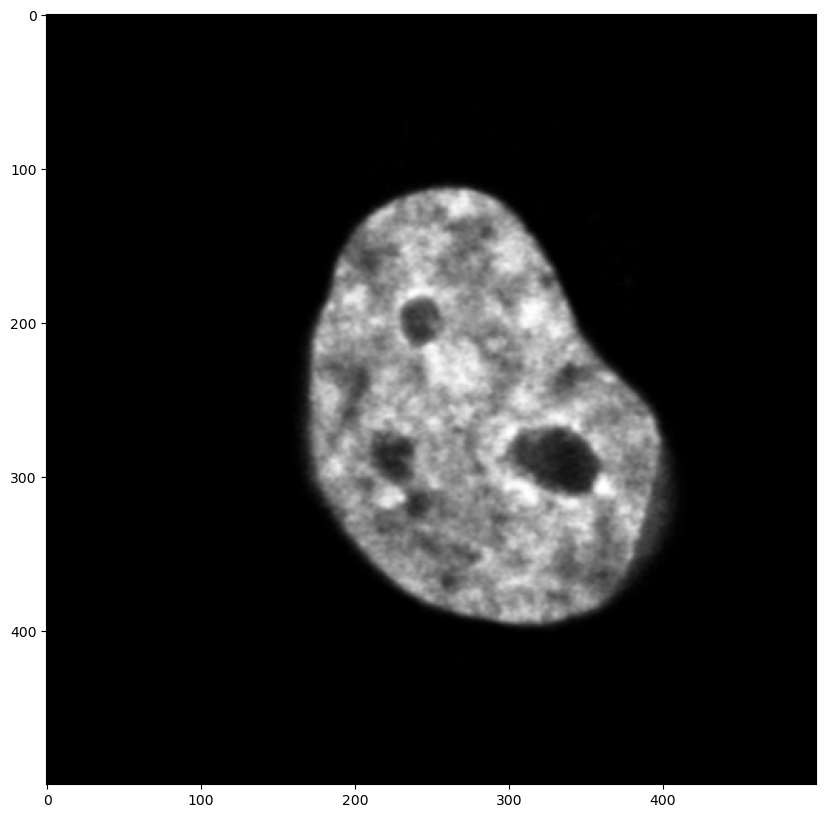

In [16]:
filtered_image = skimage.filters.gaussian(image_nuclei)
plt.subplots(figsize=(10,10))
plt.imshow(filtered_image, cmap = 'gray')

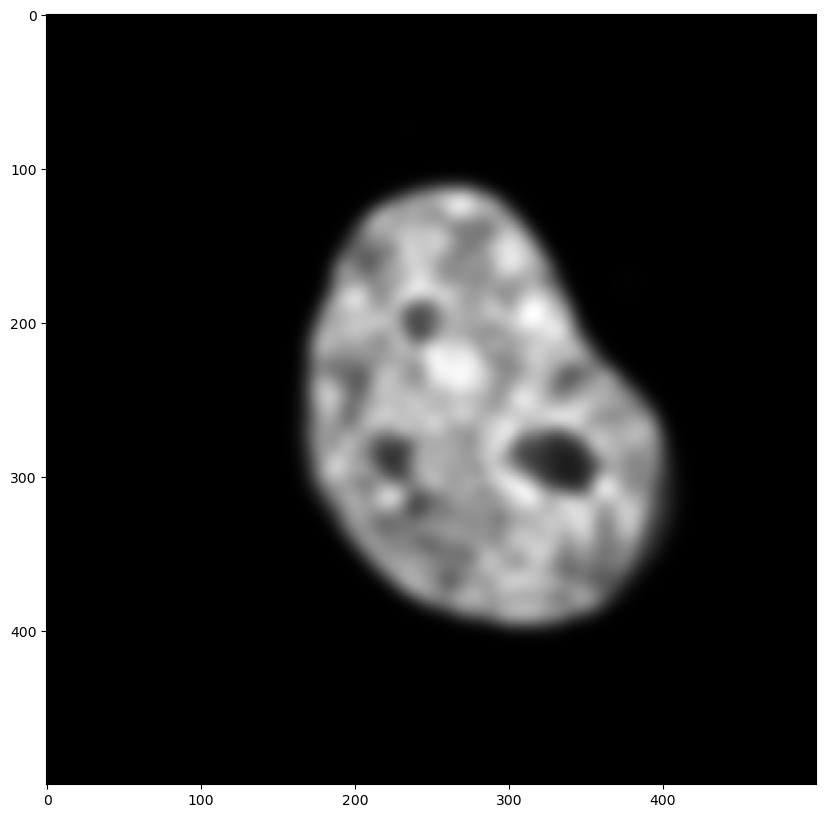

In [17]:
filtered_image = skimage.filters.gaussian(image_nuclei, sigma = 5)
plt.subplots(figsize=(10,10))
plt.imshow(filtered_image, cmap = 'gray')

Image filtering is of course a **vast** topic, and you should read more about it if you need it in your work. This example just illustrates how to use filters in Python using scikit-image.

## Non-linear filters

Another class of filters does not use convolution to filter the image but does some other type of operation on small neighborhoods of the image. For example it can calculate the median value of each 3x3 sub-region in the image. This is extremely useful if our image has pixels that are "dead" or have extremely large values.

For purpose of illustration, we can artificially create such an image using a skimage utility:

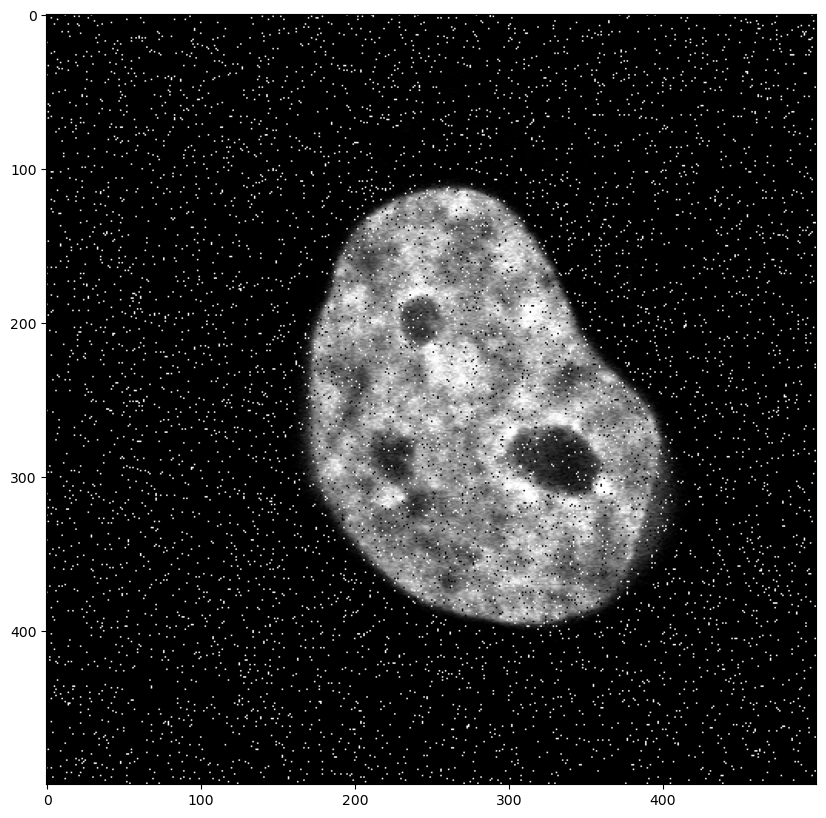

In [18]:
image_noisy = skimage.util.random_noise(image_nuclei, mode='s&p')
plt.subplots(figsize=(10,10))
plt.imshow(image_noisy, cmap = 'gray')

If we apply a median filter of size 3x3, pixels which are completely out of range are going to be replaced by the median value of their surroundings. The others, will be mildly affected:

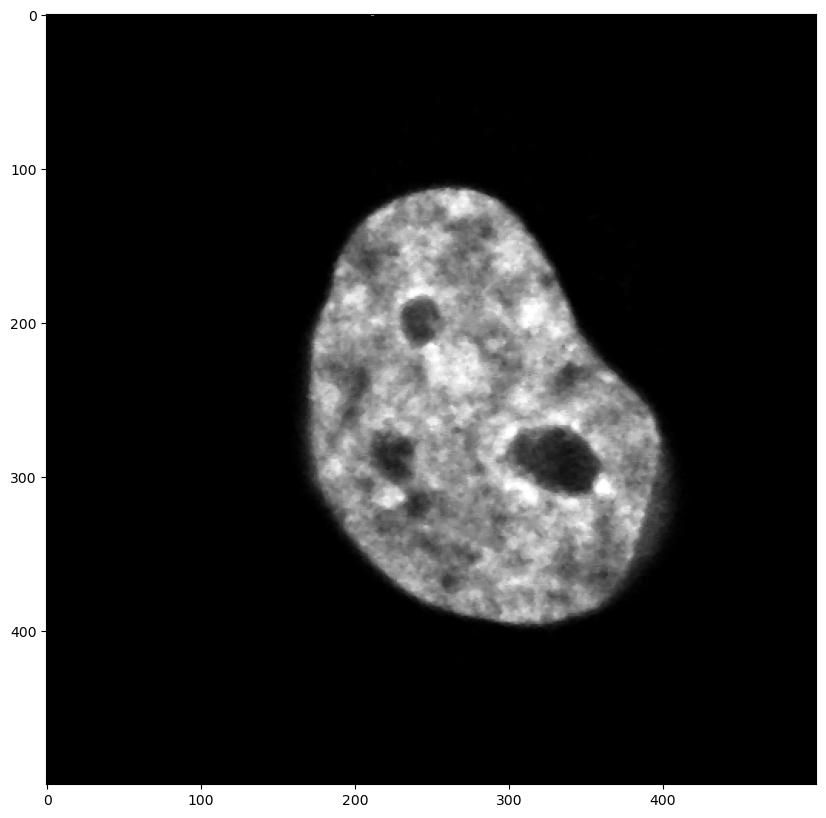

In [19]:
filtered_median = skimage.filters.median(image_noisy)

plt.subplots(figsize=(10,10))
plt.imshow(filtered_median, cmap = 'gray')

This is a complete success!

### Other selection elements

Until now we have relied on the default regions considered for filtering. For example the median filter operates by default on a 3x3 square regions. However, we can specify any other shape or *footprint*. For example we can use a Numpy array:

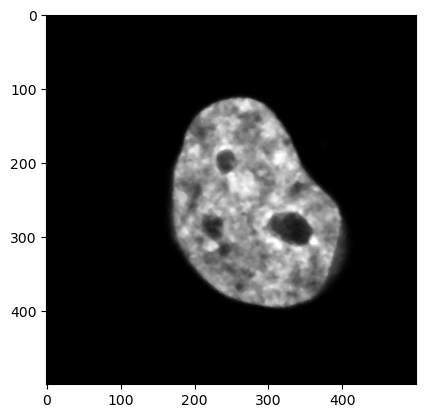

In [20]:
footprint = np.ones((5,5))
filtered_median = skimage.filters.median(image_noisy, footprint=footprint)
plt.imshow(filtered_median, cmap = 'gray')

Alternatively, we can use pre-made shapes that are available directly in scikit-image. For example a disk with a certain radius. 

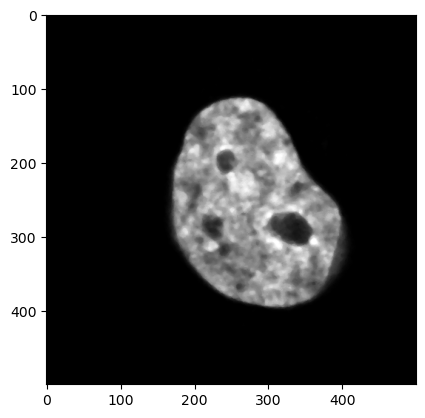

In [21]:
footprint = skimage.morphology.disk(3)
filtered_median = skimage.filters.median(image_noisy, footprint=footprint)
plt.imshow(filtered_median, cmap = 'gray')

## Morphological filters

When working with masks, one can use another class of filters, that just turn pixels ON and OFF depending on their surroundings. The simplest to understand are the erosion and dilation filters. As their names indicate, these filters either shrink or enlarge ON objects. The size and shape of the filters, specify what region is considered around objects to shrink or enlarge them. We use here again the ```footprint``` argument to specify such structuring elements.

Let's create a simple masks using an Otsu threshold:

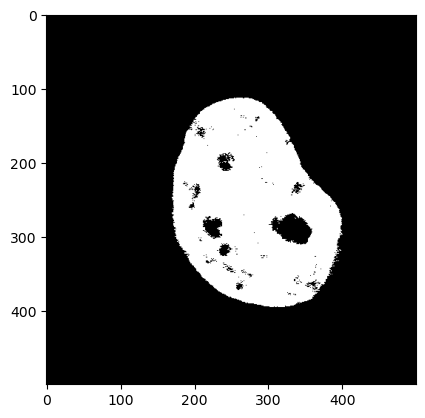

In [22]:
mask = image_nuclei > skimage.filters.threshold_otsu(image_nuclei)

plt.imshow(mask, cmap = 'gray')

We can just specify the influence region as a Numpy array. For example a square of size 5:

/var/folders/qt/cv_z53qj3slg96p_8c13sxr40000gn/T/ipykernel_23623/3509635659.py:3: FutureWarning: `binary_erosion` is deprecated since version 0.26 and will be removed in version 0.28. Use `skimage.morphology.erosion` instead. Note the pixel shift by 1 for even-sized footprints (see docstring notes).
  eroded = skimage.morphology.binary_erosion(mask, footprint=influence_region)


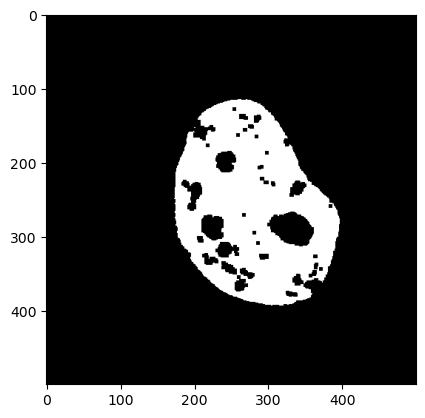

In [23]:
influence_region = np.ones((5,5))

eroded = skimage.morphology.binary_erosion(mask, footprint=influence_region)

plt.imshow(eroded, cmap = 'gray')

We can erode even more:

/var/folders/qt/cv_z53qj3slg96p_8c13sxr40000gn/T/ipykernel_23623/2759209897.py:3: FutureWarning: `binary_erosion` is deprecated since version 0.26 and will be removed in version 0.28. Use `skimage.morphology.erosion` instead. Note the pixel shift by 1 for even-sized footprints (see docstring notes).
  eroded = skimage.morphology.binary_erosion(mask, footprint=influence_region)


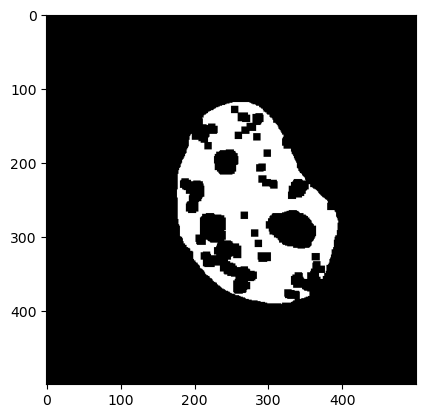

In [24]:
influence_region = np.ones((10,10))

eroded = skimage.morphology.binary_erosion(mask, footprint=influence_region)

plt.imshow(eroded, cmap = 'gray')

We can do the reverse and dilate our image:

/var/folders/qt/cv_z53qj3slg96p_8c13sxr40000gn/T/ipykernel_23623/1919647841.py:3: FutureWarning: `binary_dilation` is deprecated since version 0.26 and will be removed in version 0.28. Use `skimage.morphology.dilation` instead. Note the lack of mirroring for non-symmetric footprints (see docstring notes).
  dilated = skimage.morphology.binary_dilation(mask, footprint=influence_region)


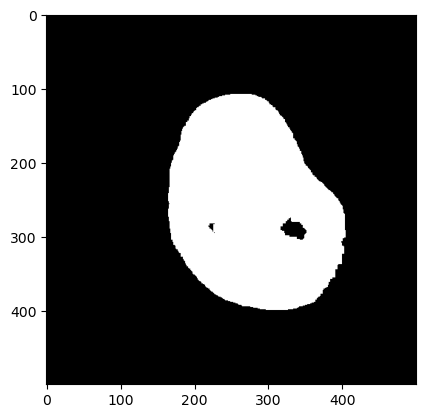

In [25]:
influence_region = np.ones((10,10))

dilated = skimage.morphology.binary_dilation(mask, footprint=influence_region)

plt.imshow(dilated, cmap = 'gray')

How are these operators useful in image processing ? Let's again imagine that we have a noisy image. Our mask would look like this:

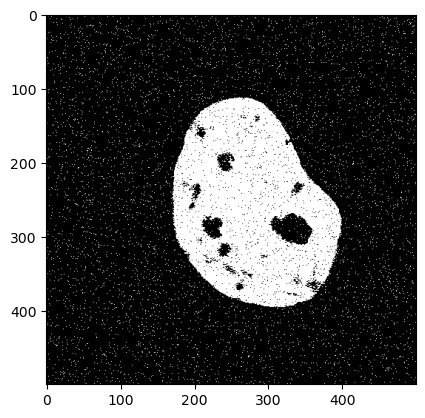

In [26]:
mask = image_noisy > skimage.filters.threshold_otsu(image_noisy)

plt.imshow(mask, cmap = 'gray')

We can now fill the little holes in the nuclei with a small dilation:

/var/folders/qt/cv_z53qj3slg96p_8c13sxr40000gn/T/ipykernel_23623/1886385394.py:3: FutureWarning: `binary_dilation` is deprecated since version 0.26 and will be removed in version 0.28. Use `skimage.morphology.dilation` instead. Note the lack of mirroring for non-symmetric footprints (see docstring notes).
  step1 = skimage.morphology.binary_dilation(mask, footprint=influence_region)


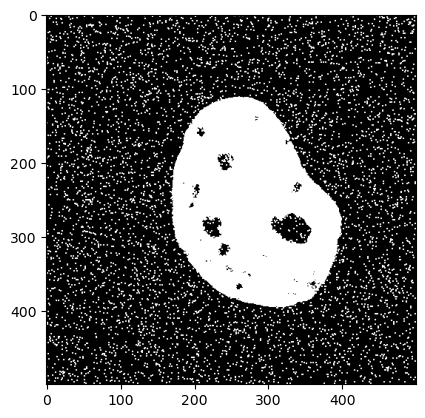

In [27]:
influence_region = np.ones((2,2))

step1 = skimage.morphology.binary_dilation(mask, footprint=influence_region)

plt.imshow(step1, cmap = 'gray')

And erode again to put the nuclei back to their original size:

/var/folders/qt/cv_z53qj3slg96p_8c13sxr40000gn/T/ipykernel_23623/3472702242.py:3: FutureWarning: `binary_erosion` is deprecated since version 0.26 and will be removed in version 0.28. Use `skimage.morphology.erosion` instead. Note the pixel shift by 1 for even-sized footprints (see docstring notes).
  step2 = skimage.morphology.binary_erosion(step1, footprint=influence_region)


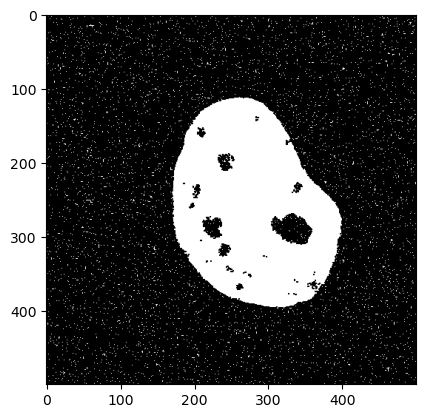

In [28]:
influence_region = np.ones((2,2))

step2 = skimage.morphology.binary_erosion(step1, footprint=influence_region)

plt.imshow(step2, cmap = 'gray')

We still have some noise. So we can do another round where we first erode the image (to remove dust) and dilate it again to recover nuclei of correct size:

/var/folders/qt/cv_z53qj3slg96p_8c13sxr40000gn/T/ipykernel_23623/1478204174.py:3: FutureWarning: `binary_erosion` is deprecated since version 0.26 and will be removed in version 0.28. Use `skimage.morphology.erosion` instead. Note the pixel shift by 1 for even-sized footprints (see docstring notes).
  step3 = skimage.morphology.binary_erosion(step2, footprint=influence_region)
/var/folders/qt/cv_z53qj3slg96p_8c13sxr40000gn/T/ipykernel_23623/1478204174.py:4: FutureWarning: `binary_dilation` is deprecated since version 0.26 and will be removed in version 0.28. Use `skimage.morphology.dilation` instead. Note the lack of mirroring for non-symmetric footprints (see docstring notes).
  step4 = skimage.morphology.binary_dilation(step3, footprint=influence_region)


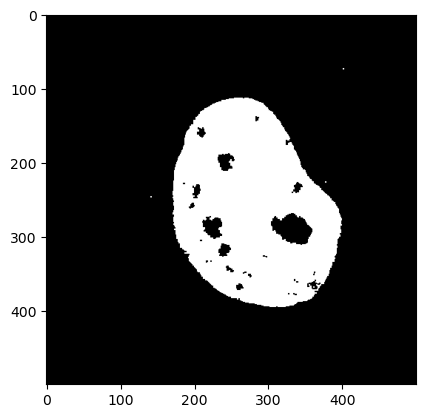

In [29]:
influence_region = np.ones((2,2))

step3 = skimage.morphology.binary_erosion(step2, footprint=influence_region)
step4 = skimage.morphology.binary_dilation(step3, footprint=influence_region)

plt.imshow(step4, cmap = 'gray')

The combination of erosion and dilation is defined as specific operators (opening, closing) and are widely used. For example, we can use the ```binary_closing``` filter which applies first a dilation and then an erosion:

/var/folders/qt/cv_z53qj3slg96p_8c13sxr40000gn/T/ipykernel_23623/2390710083.py:1: FutureWarning: `binary_closing` is deprecated since version 0.26 and will be removed in version 0.28. Use `skimage.morphology.closing` instead.
  plt.imshow(skimage.morphology.binary_closing(mask, footprint=influence_region), cmap='gray')


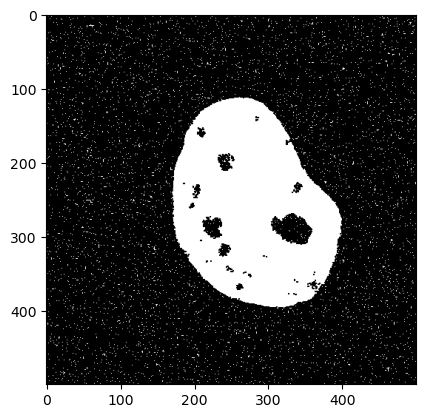

In [30]:
plt.imshow(skimage.morphology.binary_closing(mask, footprint=influence_region), cmap='gray')

Other morphological operators exist. For example one can shrink as much as possible all the structures of the image using the `convex_hull_object` function:


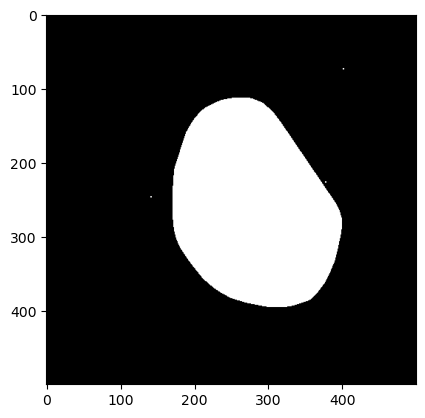

In [31]:
convex= skimage.morphology.convex_hull_object(step4)

plt.imshow(convex, cmap = 'gray')

Additionally, you can find many other tools for flood filling, removing holes, finding maxima etc. in this module. We leave it up to the reader to explore the documentation.

## Region properties

Once you have segmented an image you usually want to gather information on the objects that you "discovered". Instead of painstakingly do this manually, skimage offers a simplified way to do this with its ```regionprops_table``` tool.

Let's first create a mask of the nuclei and clean it up with morphological operations:

In [32]:
#image_stack = skimage.io.imread('images/46658_784_B12_1.tif')
image_stack = skimage.io.imread('https://github.com/guiwitz/PyImageCourse_beginner/raw/master/images/46658_784_B12_1.tif')

image_nuclei = image_stack[:,:,2]#blue channel in RGB
image_signal = image_stack[:,:,1]#green channel in RGB

# filter image
image_nuclei = skimage.filters.median(image_nuclei, skimage.morphology.disk(5))

# create mask and clean-up
mask_nuclei = image_nuclei > skimage.filters.threshold_otsu(image_nuclei)
mask_nuclei = skimage.morphology.binary_closing(mask_nuclei, footprint=skimage.morphology.disk(5))
mask_nuclei = ndi.binary_fill_holes(mask_nuclei, skimage.morphology.disk(5))

/var/folders/qt/cv_z53qj3slg96p_8c13sxr40000gn/T/ipykernel_23623/2187683814.py:12: FutureWarning: `binary_closing` is deprecated since version 0.26 and will be removed in version 0.28. Use `skimage.morphology.closing` instead.
  mask_nuclei = skimage.morphology.binary_closing(mask_nuclei, footprint=skimage.morphology.disk(5))


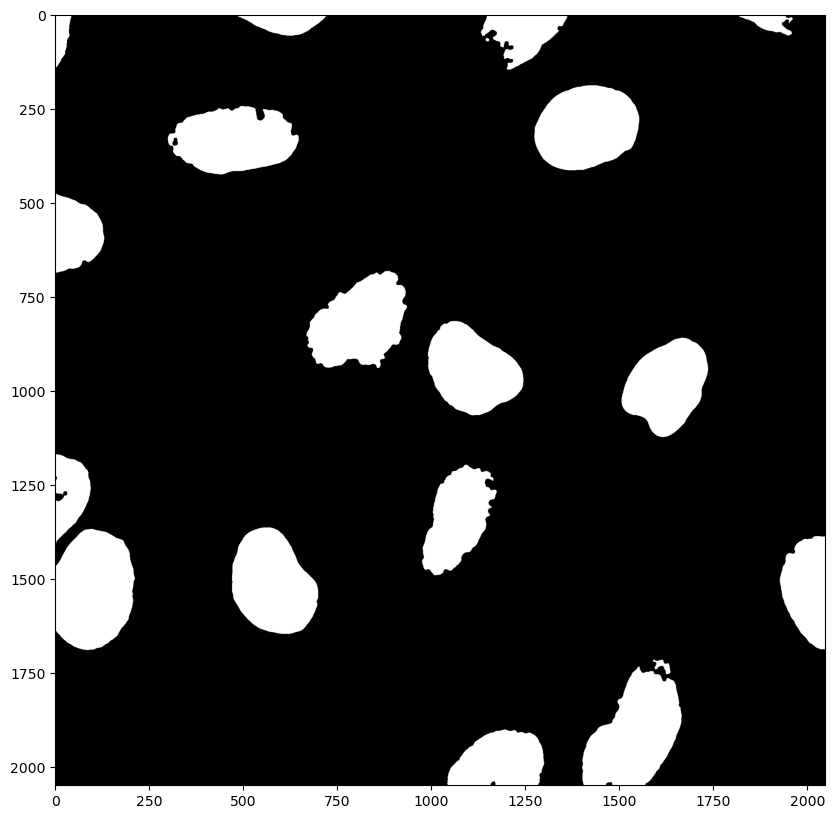

In [33]:
plt.subplots(figsize=(10,10))
plt.imshow(mask_nuclei, cmap = 'gray')

## Labelling

In order to measure objects in the image separately, we first need to label them individually. For that we can just use the ```skimage.morphology.label()``` function which looks for independent groups of white pixels and assigns them integer numbers:

In [34]:
my_labels = skimage.morphology.label(mask_nuclei)

The label map shows that numbers are assigned from top to bottom in the image:

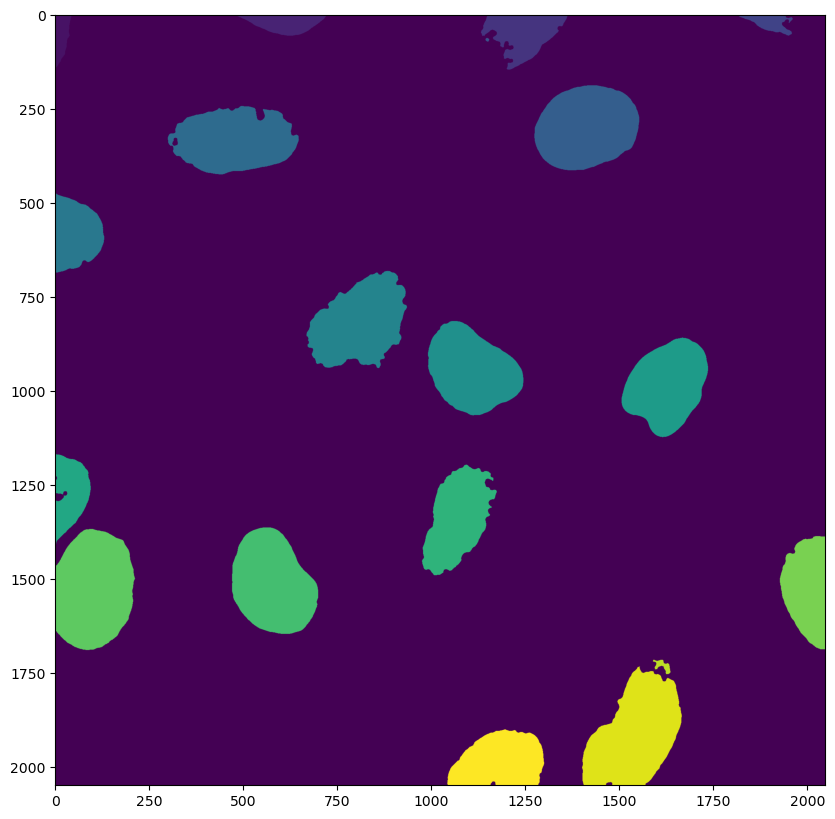

In [35]:
plt.subplots(figsize=(10,10))
plt.imshow(my_labels)

## Region properties

Now that we have each region labeled with a different number we can use the ```skimage.measure.regionprops_table()``` function, which takes such a label map and analyzes the geometric properties of each region. We have to specifiy which ```properties``` we want to use. For example the ```area``` and ```labels```:

In [36]:
my_regions = skimage.measure.regionprops_table(my_labels, properties=('label','area'))

The output is a dictionary of all properties that we requested:

In [37]:
print(my_regions)

{'label': array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20]), 'area': array([4.2210e+03, 8.3860e+03, 1.8258e+04, 4.0430e+03, 7.3000e+01,
       4.9056e+04, 4.5671e+04, 2.0537e+04, 4.6853e+04, 4.3277e+04,
       4.0768e+04, 1.5090e+04, 3.5404e+04, 4.7642e+04, 5.4978e+04,
       2.6774e+04, 4.0000e+00, 8.1200e+02, 5.4298e+04, 2.9638e+04])}


## Recovering image intensity information

In what we did above, we only recovered information about our mask. However often we want to obtain information on pixel values of the **original** image. For example, "what is the average intensity of each nucleus?"

Luckily ```regionprops_table``` allows us to pass as additional argument ```intensity_image``` the image we want to use to quantify intensity. Then we can for example add as property to extract the ```mean_intensity```:

In [38]:
my_regions = skimage.measure.regionprops_table(
    my_labels,intensity_image=image_signal, properties=('label','area','mean_intensity'))

Now we have access to additional parameters. For example the mean_intensity in each nucleus:

In [39]:
print(my_regions)

{'label': array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20]), 'area': array([4.2210e+03, 8.3860e+03, 1.8258e+04, 4.0430e+03, 7.3000e+01,
       4.9056e+04, 4.5671e+04, 2.0537e+04, 4.6853e+04, 4.3277e+04,
       4.0768e+04, 1.5090e+04, 3.5404e+04, 4.7642e+04, 5.4978e+04,
       2.6774e+04, 4.0000e+00, 8.1200e+02, 5.4298e+04, 2.9638e+04]), 'mean_intensity': array([ 79.26510306,  65.99773432,  70.26109103,  63.02671284,
        47.43835616,  53.71450995,  53.8070986 ,  70.45391245,
        66.13772864,  41.4125517 ,  58.67503925,  44.19814447,
        74.77155124,  41.70190168,  35.9041071 ,  53.07787406,
       112.        , 102.9864532 ,  56.11020664,  66.28379108])}


Now that we have this information, we can of course, plot it. For example we can produce a histogram of mean nuclei intensities:

(array([1., 2., 1., 1., 3., 2., 0., 4., 0., 2., 1., 1., 0., 0., 0., 0., 0.,
        1., 0., 1.]),
 array([ 35.9041071 ,  39.70890174,  43.51369639,  47.31849103,
         51.12328568,  54.92808032,  58.73287497,  62.53766961,
         66.34246426,  70.1472589 ,  73.95205355,  77.75684819,
         81.56164284,  85.36643748,  89.17123213,  92.97602677,
         96.78082142, 100.58561606, 104.39041071, 108.19520535,
        112.        ]),
 <BarContainer object of 20 artists>)

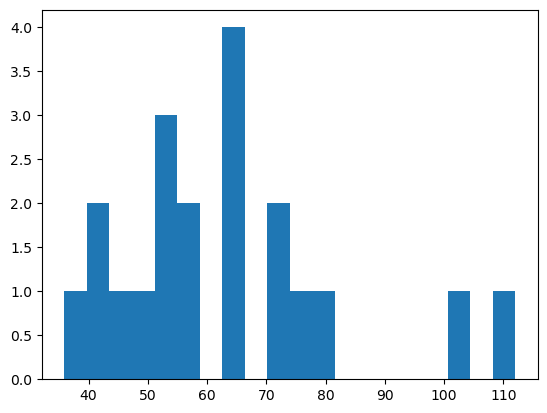

In [40]:
plt.hist(my_regions['mean_intensity'], bins=20)

## Filtering information

Obviously, we had some "bad segmentations", i.e. some fragments remaining from the processing that are not actual nuclei. We can easily filter those out for example based on size using Numpy logical indexing.

We create a logical array by setting a condition on one dictionary entry:

In [41]:
selected = my_regions['area'] > 100
selected

array([ True,  True,  True,  True, False,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True, False,  True,
        True,  True])

Then we can use it for logical indexing:

In [42]:
my_regions['mean_intensity'][selected]

array([ 79.26510306,  65.99773432,  70.26109103,  63.02671284,
        53.71450995,  53.8070986 ,  70.45391245,  66.13772864,
        41.4125517 ,  58.67503925,  44.19814447,  74.77155124,
        41.70190168,  35.9041071 ,  53.07787406, 102.9864532 ,
        56.11020664,  66.28379108])

## One step further: Pandas

In the above example, if we wanted to use one measurement to filter all other measurements, we would have to repeat the selection multiple times. Ideally, we would put all the measured properties into a table, one column per property, and then do typical database operations to sub-select parts of the data. This can be done using a Pandas DataFrame. 

Let's define a quick example DataFrame:

In [43]:
data = [[51, 92, 14, 71, 60],
        [20, 82, 86, 74, 74],
        [87, 99, 23,  2, 21]]

my_df = pd.DataFrame(data, columns=['a', 'b', 'c', 'd', 'e'])

Remember we can filter DataFrames! Just like with arrays, we can use some constraining tests. For example we can ask: are there data points in column ```c``` which are smaller than 50?

In [44]:
my_df['c'] < 50

0     True
1    False
2     True
Name: c, dtype: bool

Similarly to what happened with arrays, we get a new column that is boolean. Also, similar to what we did with arrays, we can use it for logical indexing using square brackets:

In [45]:
my_df[my_df['c'] < 50]

,a,b,c,d,e
0,51,92,14,71,60
2,87,99,23,2,21


What happened here is that we kept only those entries in the table where the values in the ```c``` column were smaller than 50: we filtered all the properties (columns) in our table in one go! This is the same kind of logical indexing and filtering we used to remove outliers in our data analysis.

### Back to our problem

In our analysis we ended up with a dictionary:

In [46]:
print(my_regions)

{'label': array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20]), 'area': array([4.2210e+03, 8.3860e+03, 1.8258e+04, 4.0430e+03, 7.3000e+01,
       4.9056e+04, 4.5671e+04, 2.0537e+04, 4.6853e+04, 4.3277e+04,
       4.0768e+04, 1.5090e+04, 3.5404e+04, 4.7642e+04, 5.4978e+04,
       2.6774e+04, 4.0000e+00, 8.1200e+02, 5.4298e+04, 2.9638e+04]), 'mean_intensity': array([ 79.26510306,  65.99773432,  70.26109103,  63.02671284,
        47.43835616,  53.71450995,  53.8070986 ,  70.45391245,
        66.13772864,  41.4125517 ,  58.67503925,  44.19814447,
        74.77155124,  41.70190168,  35.9041071 ,  53.07787406,
       112.        , 102.9864532 ,  56.11020664,  66.28379108])}


We can also easily turn this dictionary into a DataFrame:

In [47]:
my_regions_df = pd.DataFrame(my_regions)
my_regions_df

,label,area,mean_intensity
0,1,4221.0,79.265103
1,2,8386.0,65.997734
2,3,18258.0,70.261091
3,4,4043.0,63.026713
4,5,73.0,47.438356
5,6,49056.0,53.714510
6,7,45671.0,53.807099
7,8,20537.0,70.453912
8,9,46853.0,66.137729
9,10,43277.0,41.412552


Now we can use what we have just learned; let's remove tiny regions with an area smaller than 100, as these are likely artifacts:

In [48]:
filtered_df = my_regions_df[my_regions_df['area'] > 100]
filtered_df

,label,area,mean_intensity
0,1,4221.0,79.265103
1,2,8386.0,65.997734
2,3,18258.0,70.261091
3,4,4043.0,63.026713
5,6,49056.0,53.714510
6,7,45671.0,53.807099
7,8,20537.0,70.453912
8,9,46853.0,66.137729
9,10,43277.0,41.412552
10,11,40768.0,58.675039


We see that we indeed removed two elements in that table, indices 4 and 16.

Now we have come full-circle from Arrays and DataFrames to Images and back to Data Analysis. Once again we have a Dataframe and could do some descriptive statistics, then on to hypothesis testing.

## Exercises

### Exercise 1 (2 pts)
Grab the blue channel of the image. Filter the blue channel of using a median filter with a disk of size 5. Use otsu thresholding to generate a binary version of the image.

/var/folders/qt/cv_z53qj3slg96p_8c13sxr40000gn/T/ipykernel_23623/1070460104.py:7: FutureWarning: `binary_closing` is deprecated since version 0.26 and will be removed in version 0.28. Use `skimage.morphology.closing` instead.
  mask = skimage.morphology.binary_closing(mask, footprint=skimage.morphology.disk(5))


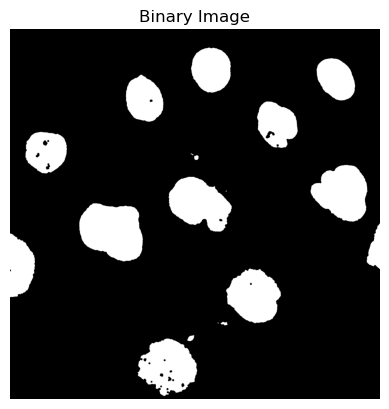

In [57]:
image = skimage.io.imread('exercise.tif')

blue_channel = image[:,:,2] #blue channel in RGB
filtered_median = skimage.filters.median(blue_channel, skimage.morphology.disk(5))

mask = filtered_median > skimage.filters.threshold_otsu(filtered_median)
mask = skimage.morphology.binary_closing(mask, footprint=skimage.morphology.disk(5))

plt.imshow(mask, cmap='gray')
plt.title('Binary Image')
plt.axis('off')
plt.show()



### Exercise 2 (2 pts) 
Use binary closing and fill holes with a disk of size 5 to clean up 

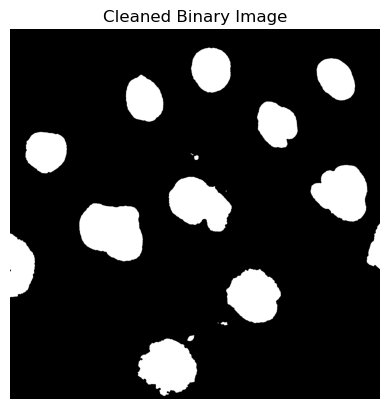

In [59]:
# Answer here
from skimage.morphology import closing, disk
from scipy.ndimage import binary_fill_holes

closed = closing(mask, disk(5))
filled = binary_fill_holes(closed)

import matplotlib.pyplot as plt
plt.imshow(filled, cmap='gray')
plt.title('Cleaned Binary Image')
plt.axis('off')
plt.show()

### Exercise 3 (2 pts)
 Calculate the areas of all the regions

In [60]:
from skimage.measure import label, regionprops
labeled = label(filled)
regions = regionprops(labeled)
areas = [region.area for region in regions]
print(areas)

[np.float64(42830.0), np.float64(36758.0), np.float64(40282.0), np.float64(42205.0), np.float64(41276.0), np.float64(65.0), np.float64(512.0), np.float64(69627.0), np.float64(70257.0), np.float64(24.0), np.float64(87211.0), np.float64(10834.0), np.float64(36434.0), np.float64(65328.0), np.float64(481.0), np.float64(21.0), np.float64(835.0), np.float64(70974.0)]


### Exercise 4 (2 pt)
Convert the region dictionary to a data frame and select those regions with a minimum area of 1000

In [61]:
import pandas as pd
from skimage.measure import regionprops_table

region_dict = regionprops_table(labeled, properties=['label', 'area'])
df = pd.DataFrame(region_dict)
df_filtered = df[df['area'] >= 1000]
print(df_filtered)

    label     area
0       1  42830.0
1       2  36758.0
2       3  40282.0
3       4  42205.0
4       5  41276.0
7       8  69627.0
8       9  70257.0
10     11  87211.0
11     12  10834.0
12     13  36434.0
13     14  65328.0
17     18  70974.0


### Exercise 5 (2 pts)
Determine the average nucleus area and the maximum nuceus area 

In [ ]:
# Answer here
average_area = df_filtered['area'].mean()
maximum_area = df_filtered['area'].max()
print("Average nucleus area:", average_area)
print("Maximum nucleus area:", maximum_area)


Average nucleus area: 51168.0
Maximum nucleus area: 87211.0
